In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from glob import glob
import ombre as om
import numpy as np
import matplotlib.pyplot as plt
import os
from astropy.io import fits

In [3]:
names = [f.split('/')[-1] for f in glob('/Volumes/Nibelheim/hst/data/*')]

/var/folders/yn/f2r51bxd7pj58243x2y_c6340000gn/T/ipykernel_80929/262884003.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


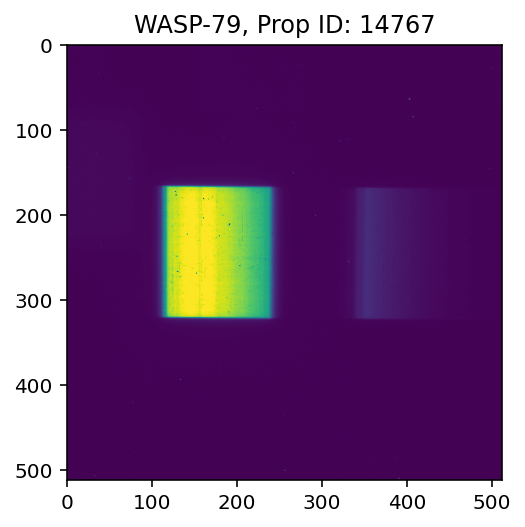

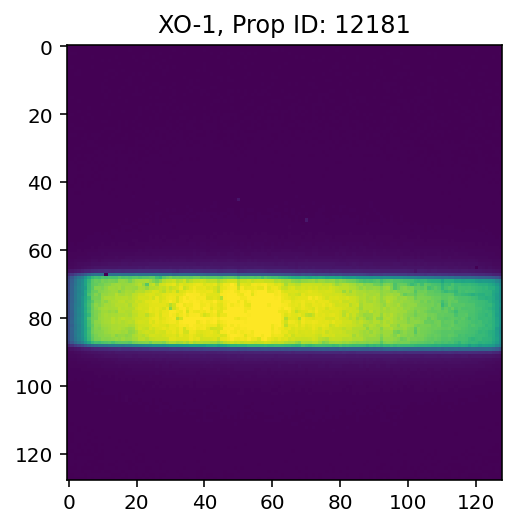

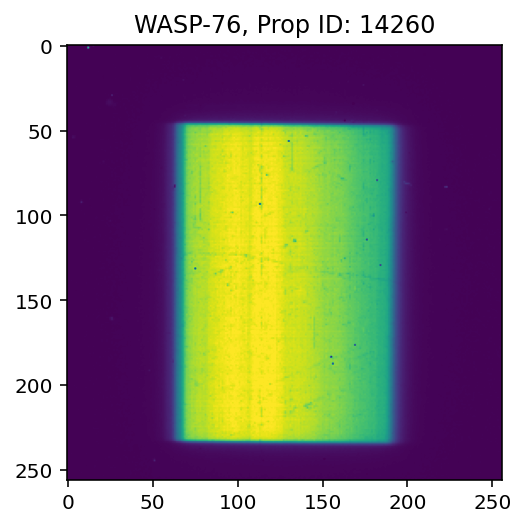

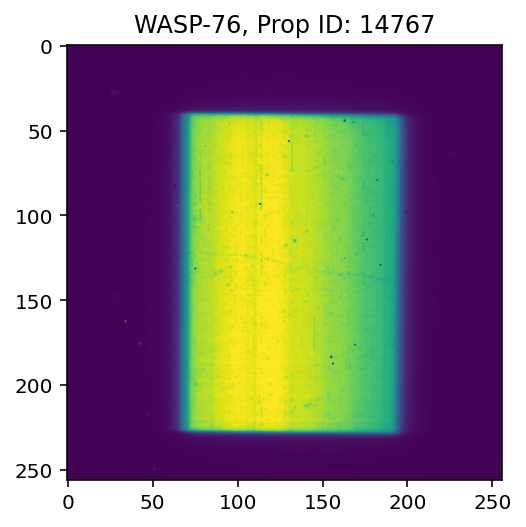

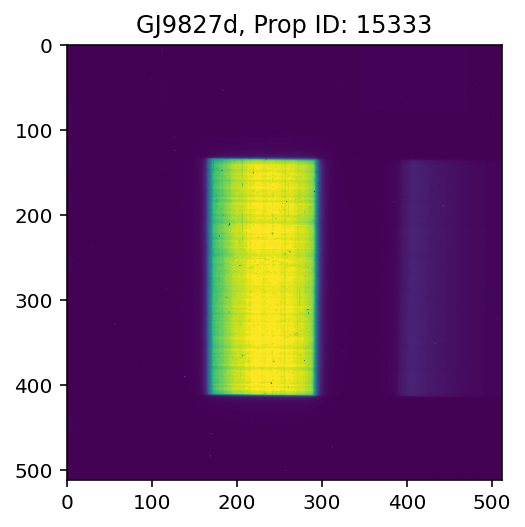

...

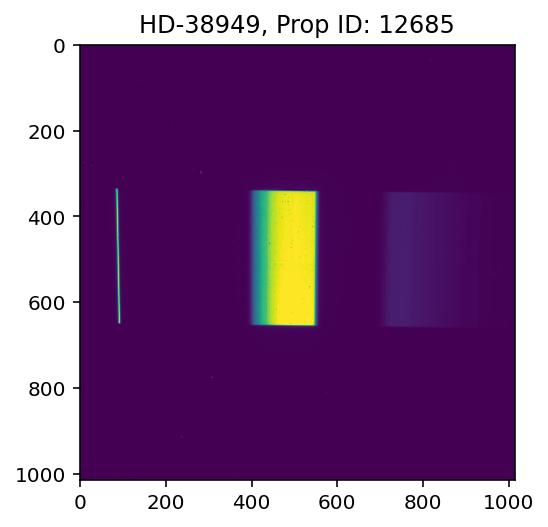

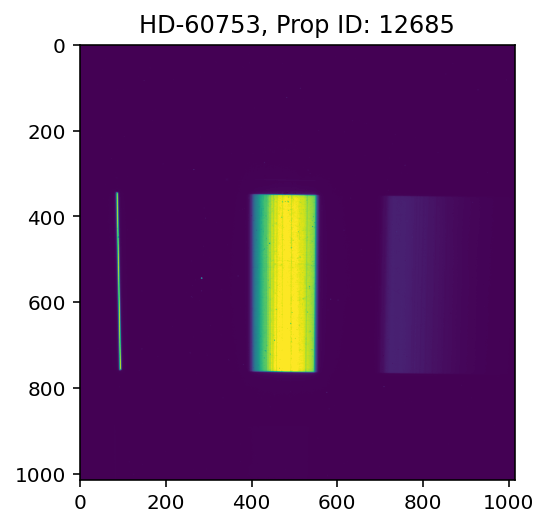

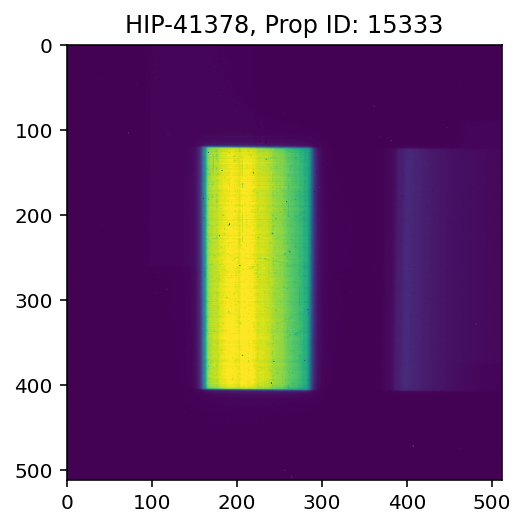

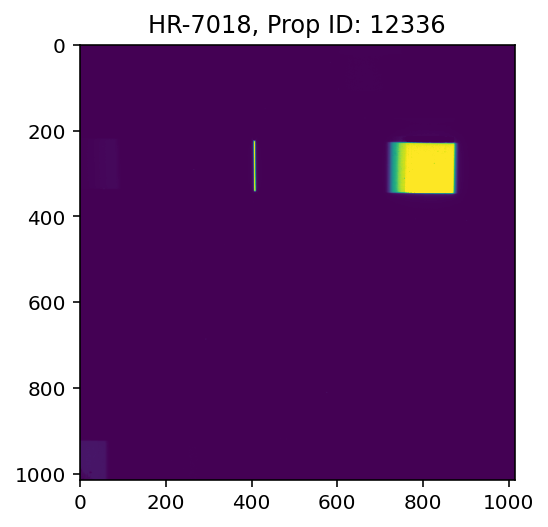

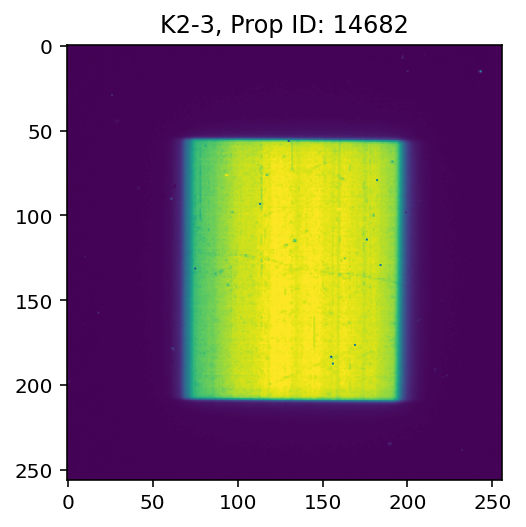

In [131]:
for name in names:
    fnames = np.sort(glob(f'/Volumes/Nibelheim/hst/data/{name}/*'))
    propid = 0
    for fname in fnames:
        if not os.path.isfile(fname): 
            continue        
        with fits.open(fname, lazy_load_hdus=True) as hdu:
            if propid == hdu[0].header['PROPOSID']:
                continue
            filter = hdu[0].header['FILTER']
            if filter.startswith('F'):
                continue
            propid = hdu[0].header['PROPOSID']

            plt.figure()
            plt.imshow(hdu[1].data, vmin=0, vmax=np.nanpercentile(hdu[1].data, 99))
            plt.title(f'{name}, Prop ID: {propid}')

In [9]:
names = ['X0-2']

In [12]:
for idx, name in enumerate(names):
    if name == 'other':
        continue
    if name.endswith('.csv'):
        continue
    print(name)
    obs = om.Observation.from_files(glob(f'/Volumes/Nibelheim/hst/data/{name}/*.fits'))
    spec = obs.stellar_spectra
    spec.plot()
    spec.hdulist.writeto(f'results/{name}_stellar_spectrum.fits', overwrite=True)

IndentationError: unexpected indent (241347073.py, line 7)

'WASP-79'

In [187]:
obs = om.Observation.from_MAST('XO-2')

KeyboardInterrupt: 

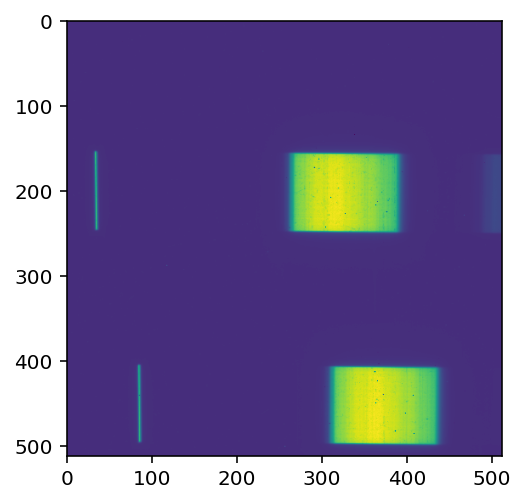

In [181]:
plt.imshow(np.mean(obs[0].sci, axis=0))

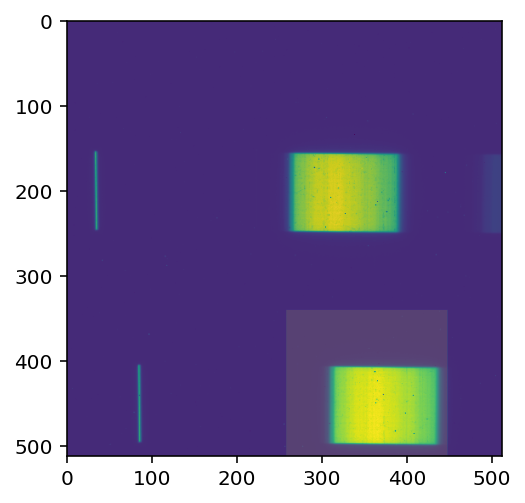

In [123]:
plt.imshow(obs[0].sci[0])
plt.imshow(obs[0]._target_block, alpha=0.1)

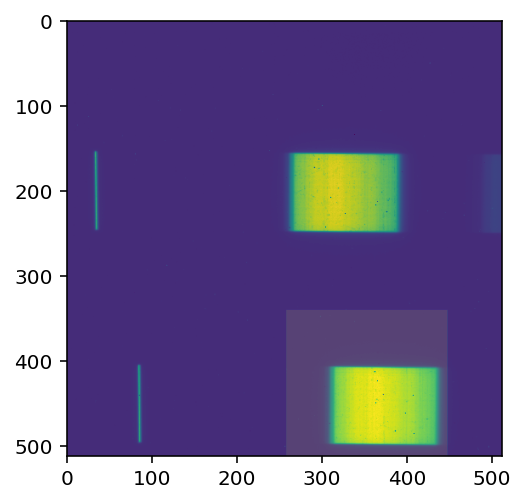

In [124]:
plt.imshow(obs[2].sci[0])
plt.imshow(obs[2]._target_block, alpha=0.1)

/Users/ch/HST/projects/ombre/src/ombre/observation.py:416: RuntimeWarning: divide by zero encountered in true_divide
  spec = visit.average_spectrum[0, 0, :] / visit.sensitivity
/Users/ch/HST/projects/ombre/src/ombre/observation.py:419: RuntimeWarning: invalid value encountered in true_divide
  y.append(spec / c)


<AxesSubplot:title={'center':'XO-2 Stellar Spectrum'}, xlabel='Wavelength', ylabel='$\\delta$ Transit Depth [ppm]'>

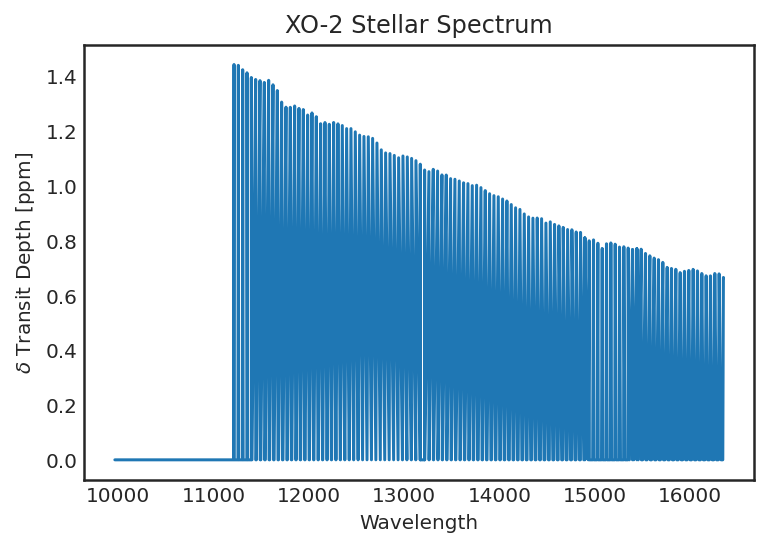

In [125]:
obs.stellar_spectra.plot()

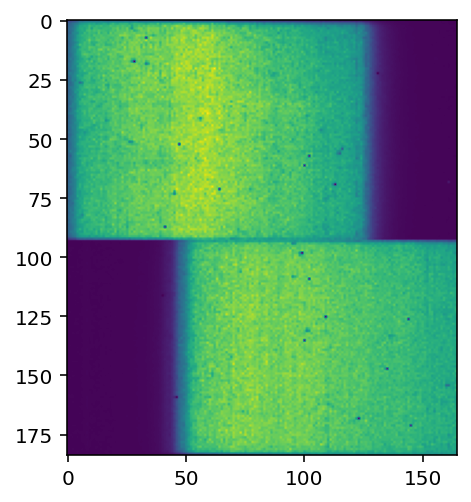

In [72]:
plt.imshow(obs[0].data[0])

In [51]:
visit = obs[0]

In [52]:
visit.wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 117.0293406891  50.21788116089  
CRPIX : 249.0  276.0  
CD1_1 CD1_2  : -3.7443133891615e-05  -3.5076642620213e-06  
CD2_1 CD2_2  : -3.8095316189555e-06  3.3456765072876e-05  
NAXIS : 512  512

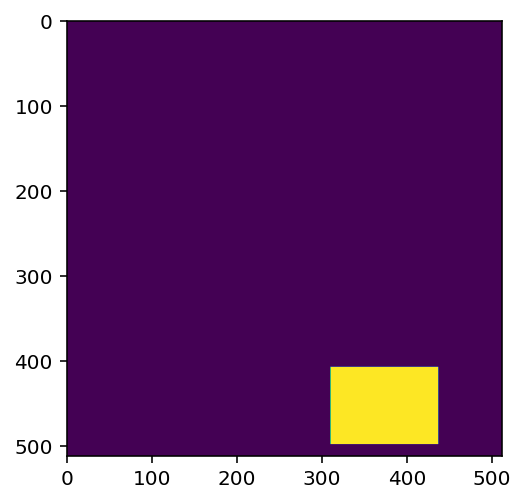

In [55]:
plt.imshow(visit.mask[0])

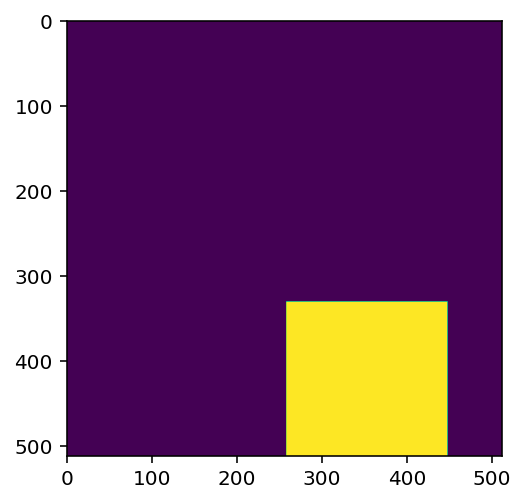

In [47]:
plt.imshow(visit._target_block)

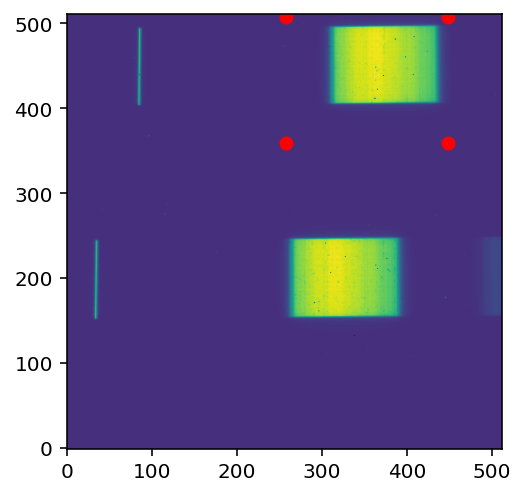

In [40]:
plt.imshow(obs[0].sci[0], origin='lower')
plt.scatter(x1, y1, c='r')
plt.scatter(x1, y2, c='r')
plt.scatter(x2, y1, c='r')
plt.scatter(x2, y2, c='r')


In [46]:
obs.ra, obs.dec

(117.0288174106, 50.221035358419996)

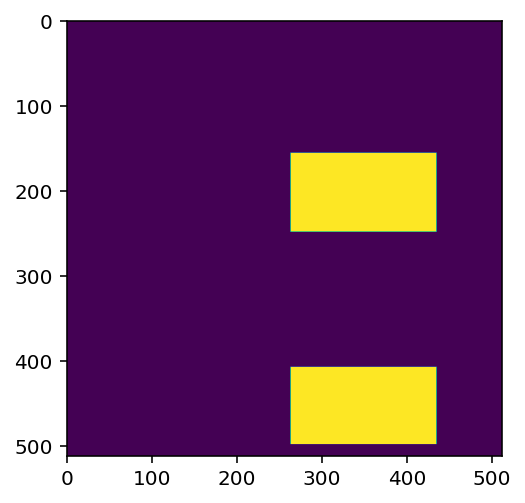

In [43]:
plt.imshow(obs[0].mask[0])

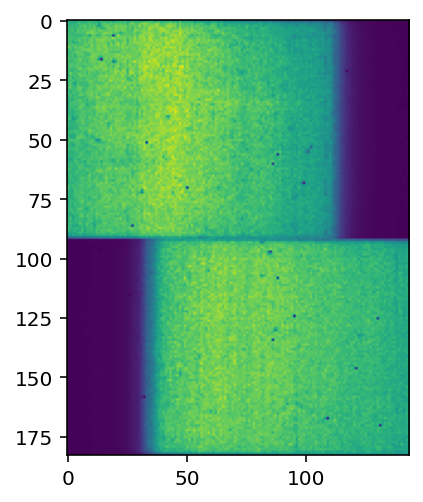

In [32]:
plt.imshow(obs[2].data[0])